# Import the Libraries and Dependencies


In [1]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import PIL.Image as Image
from torch.optim import optimizer
import matplotlib.pyplot as plt
from torchvision import transforms, models

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
IMAGES_PATH = "/kaggle/input/style-data"

# Load the VGG19 Model


In [4]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False)

vgg.to(device)

c:\Users\Ismail\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Ismail\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

# Load the content image


In [5]:
def load_img(img_path, img_size = 512, shape=None):
    img = Image.open(img_path).convert("RGB")

    if max(img.size) < img_size:
        img_size = max(img.size)

    if shape is not None:
        img_size = shape    

    transform = transforms.Compose([transforms.Resize(img_size),
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.5, 0.5, 0.5), (0.5,0.5,0.5))])
    
    return transform(img).unsqueeze(0)

In [6]:
def np_convert(tensor):
    img = tensor.to("cpu").clone().detach().numpy()
    img = img.squeeze()
    img = img.transpose(1,2,0)
    img = img * np.array((0.5,0.5,0.5)) + np.array((0.5,0.5,0.5))

    return img.clip(0,1)

In [7]:
def get_features(img, model):
    layers = {'0': 'conv1_1', '5': 'conv2_1', '10': 'conv3_1', '19': 'conv4_1', '21': 'conv4_2', '28': 'conv5_1'}

    features = {}

    for name, layer in model._modules.items():
        img = layer(img)
        if name in layers:
            features[layers[name]] = img

    return features

In [8]:
def gram_matrix(tensor):
    _, c, h, w = tensor.size()
    tensor = tensor.view(c, h*w)
    gram = torch.mm(tensor, tensor.t())

    return gram

In [9]:
content = load_img(os.path.join(IMAGES_PATH, "F:\FAST STUFF\ANN\Solutions\Assignment 8\Style Transfer\Style-Transfer-main\Images\shrek_PNG3.png"), shape=(512, 512)).to(device)
style = load_img(os.path.join(IMAGES_PATH, "F:\FAST STUFF\ANN\Solutions\Assignment 8\Style Transfer\Style-Transfer-main\Images\spaghetti.jpg"), shape=(512, 512)).to(device)

# Visualize the contect image


(-0.5, 511.5, 511.5, -0.5)

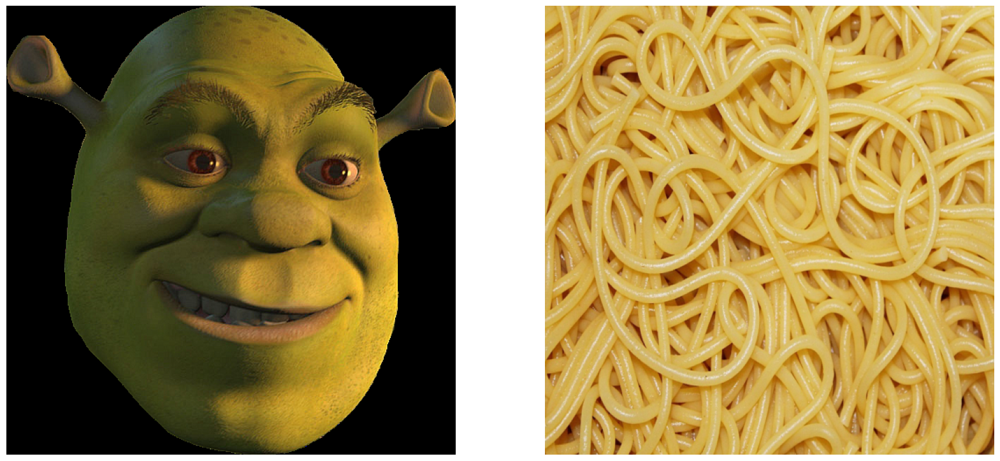

In [10]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,10))

ax1.imshow(np_convert(content))
ax1.axis("off")
ax2.imshow(np_convert(style))
ax2.axis("off")

In [11]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

In [12]:
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

In [13]:
style_weights = {'conv1_1': 1.0, 'conv2_1': 0.75, 'conv3_1': 0.2, 'conv4_1': 0.2, 'conv5_1': 0.2}

content_weight = 1
style_weight = 1e6

In [14]:
target = content.clone().requires_grad_(True).to(device)

In [16]:
# verbose = 300
# optimizer = torch.optim.Adam([target], lr=0.003)
# num_steps = 12000

# height, width, channels = np_convert(target).shape
# img_array = np.empty((num_steps, height, width, channels))
# cap_frame = num_steps / 300

# ctr = 0

Step 300, Total Loss: 6646384.5


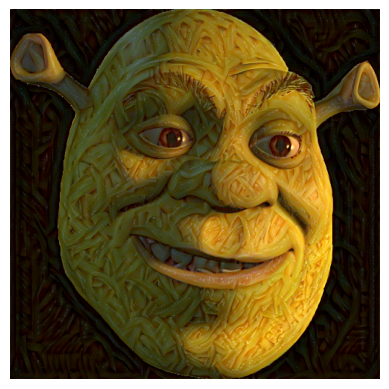

Step 600, Total Loss: 4530335.5


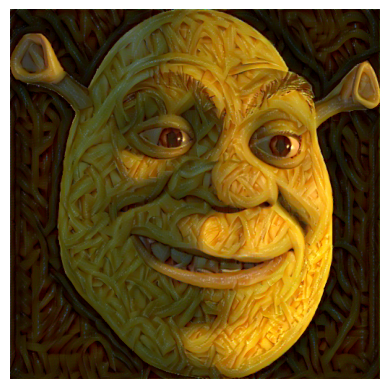

Step 900, Total Loss: 3425895.5


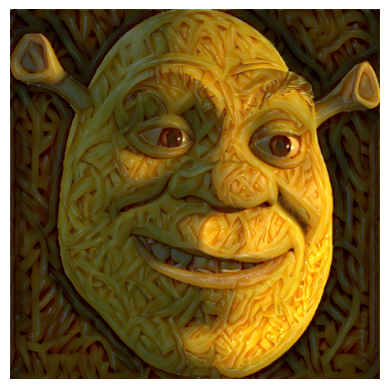

Step 1200, Total Loss: 2660277.75


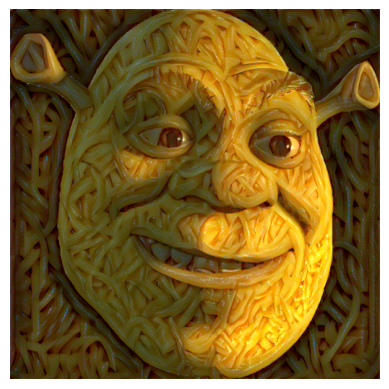

Step 1500, Total Loss: 2072396.5


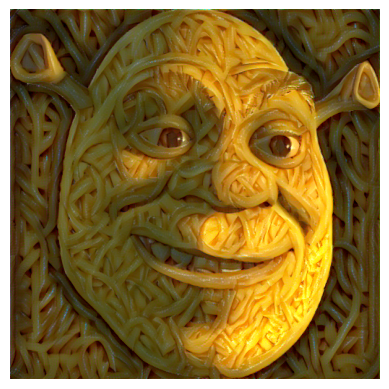

Step 1800, Total Loss: 1603022.5


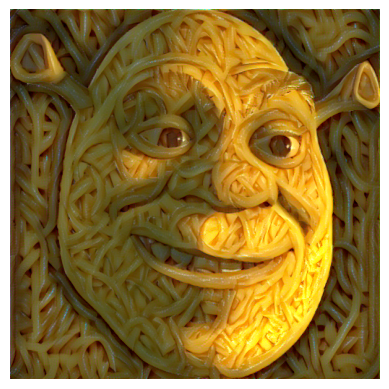

Step 2100, Total Loss: 1225924.375


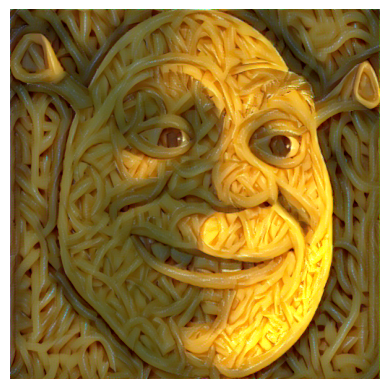

Step 2400, Total Loss: 927821.0


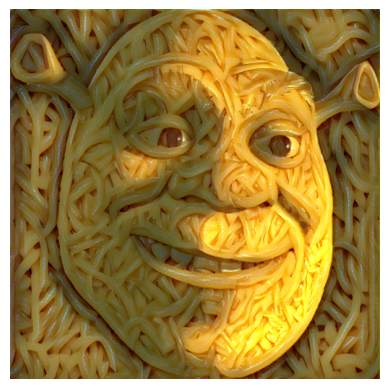

Step 2700, Total Loss: 695713.5


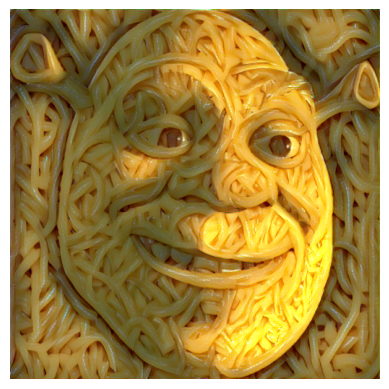

Step 3000, Total Loss: 516198.9375


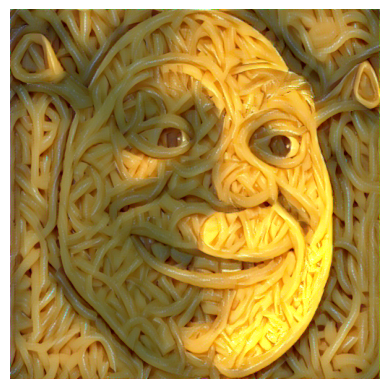

Step 3300, Total Loss: 378001.78125


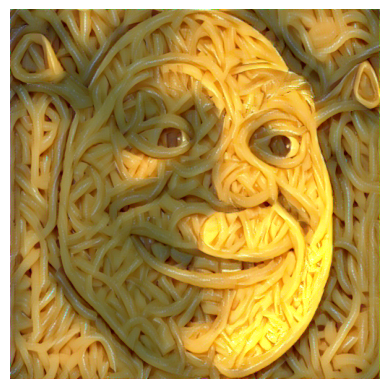

Step 3600, Total Loss: 276814.84375


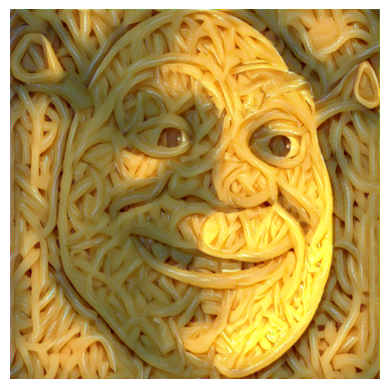

Step 3900, Total Loss: 202720.265625


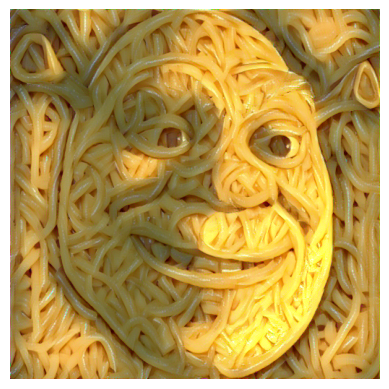

Step 4200, Total Loss: 151255.09375


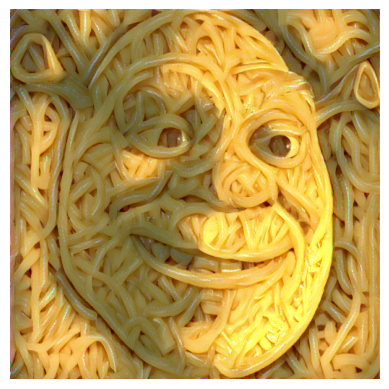

Step 4500, Total Loss: 115100.8203125


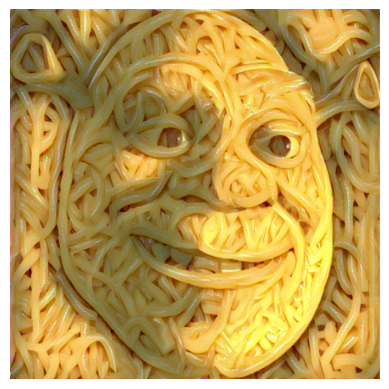

Step 4800, Total Loss: 89161.109375


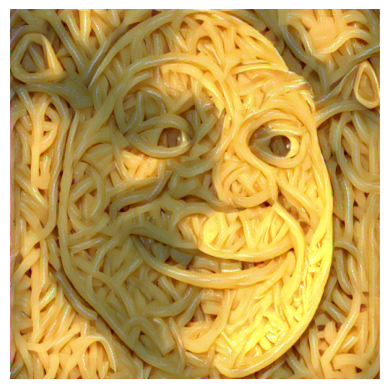

Step 5100, Total Loss: 71739.8359375


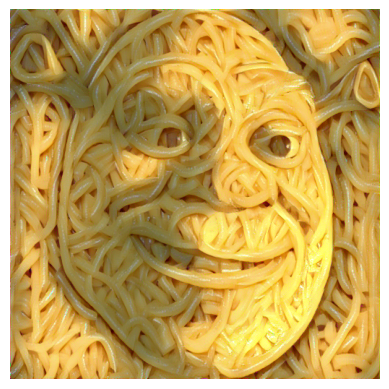

Step 5400, Total Loss: 58431.44140625


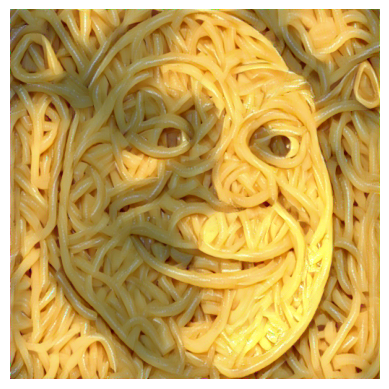

Step 5700, Total Loss: 49963.90234375


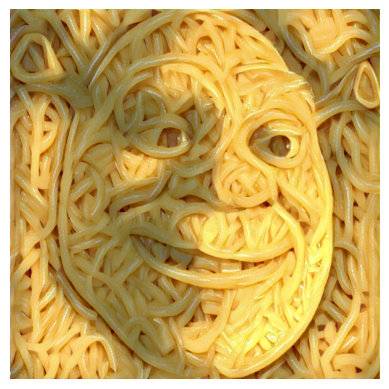

Step 6000, Total Loss: 43254.58984375


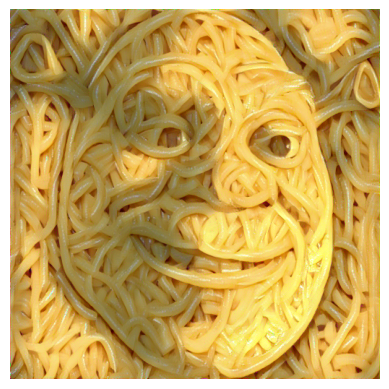

Step 6300, Total Loss: 38355.40625


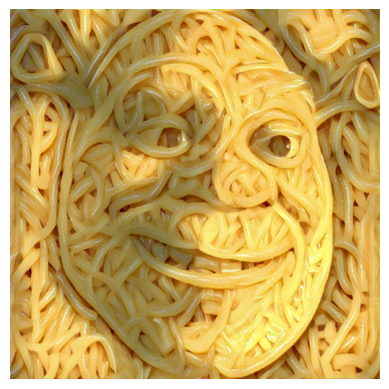

Step 6600, Total Loss: 35028.44921875


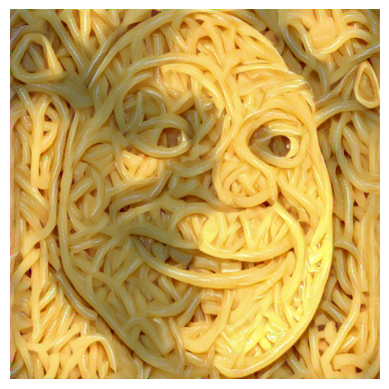

Step 6900, Total Loss: 31949.05078125


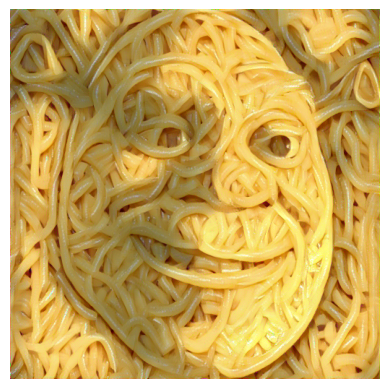

Step 7200, Total Loss: 29967.720703125


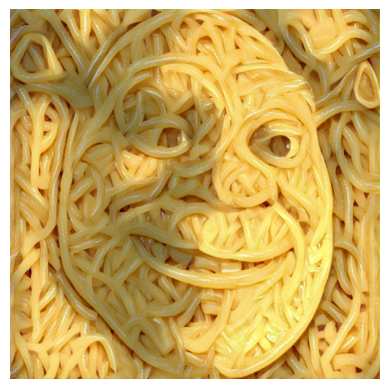

Step 7500, Total Loss: 28190.466796875


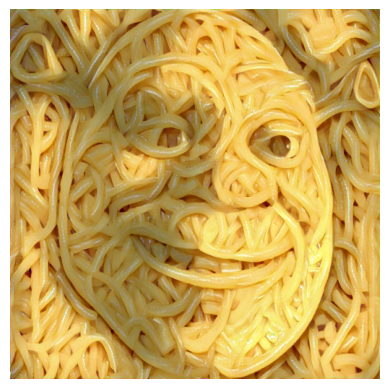

Step 7800, Total Loss: 27189.123046875


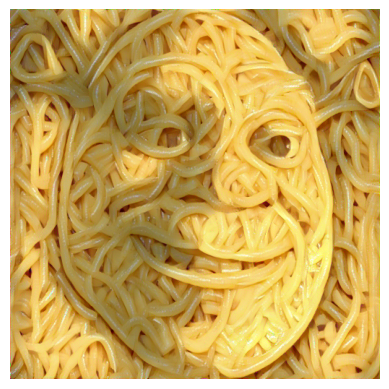

Step 8100, Total Loss: 25897.974609375


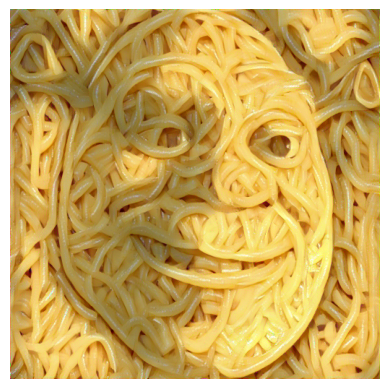

Step 8400, Total Loss: 24390.80078125


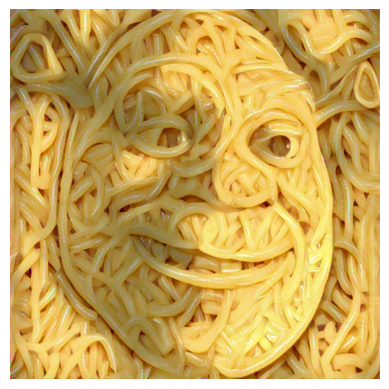

Step 8700, Total Loss: 23488.369140625


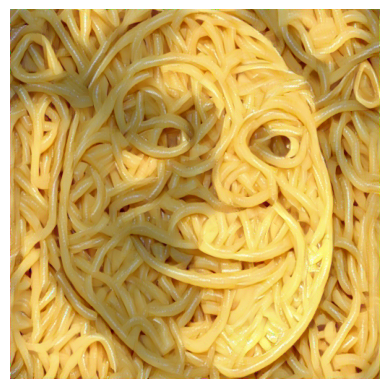

Step 9000, Total Loss: 23430.87890625


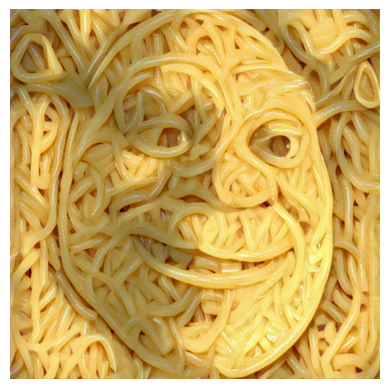

Step 9300, Total Loss: 22793.83984375


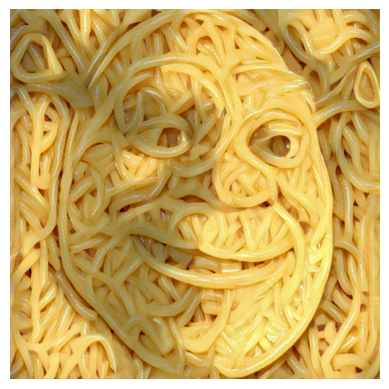

Step 9600, Total Loss: 21533.20703125


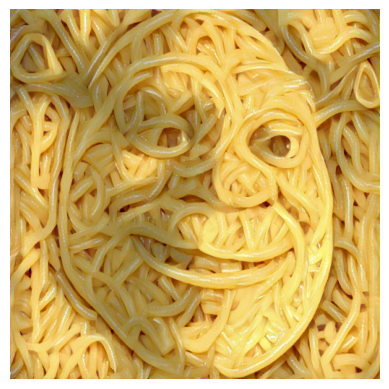

Step 9900, Total Loss: 21131.671875


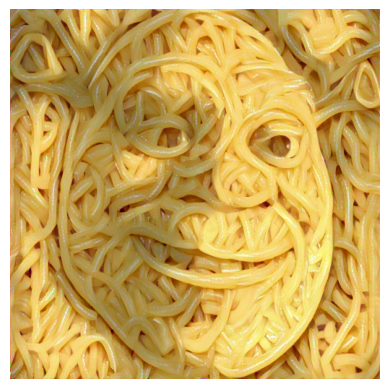

Step 10200, Total Loss: 20372.544921875


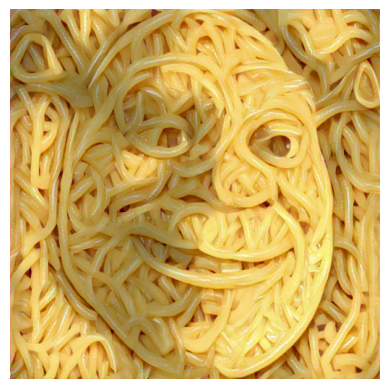

Step 10500, Total Loss: 20034.814453125


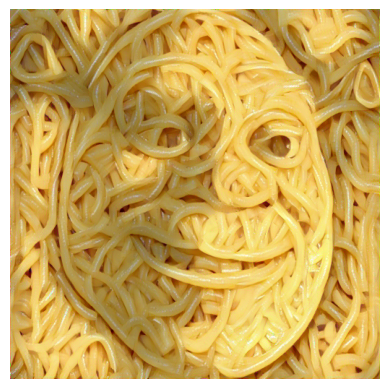

Step 10800, Total Loss: 20364.5703125


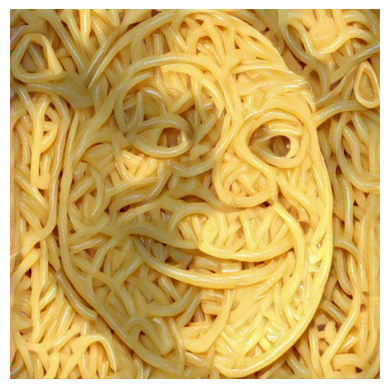

Step 11100, Total Loss: 19333.28515625


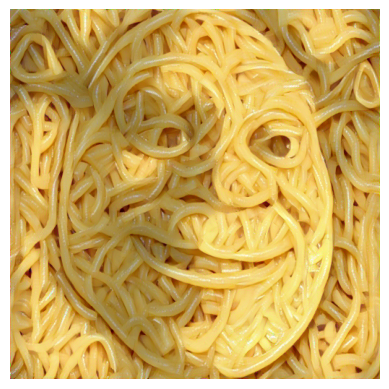

Step 11400, Total Loss: 20787.275390625


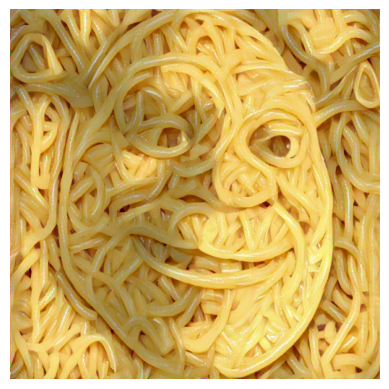

Step 11700, Total Loss: 21568.390625


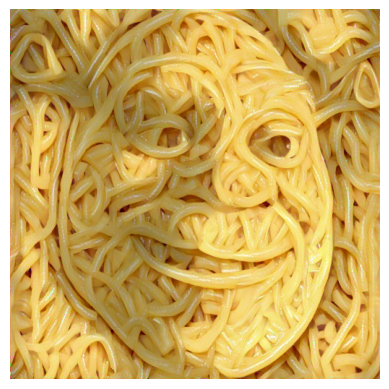

Step 12000, Total Loss: 18551.365234375


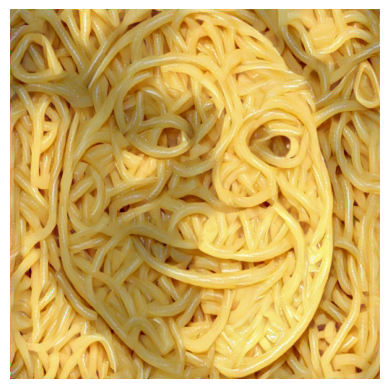

In [ ]:
for i in range(1, num_steps+1):
    target_features = get_features(target, vgg)

    content_loss = torch.mean(torch.square(target_features['conv4_2'] - content_features['conv4_2']))

    style_loss = 0.0

    for layer in style_weights:
        target_feature = target_features[layer]
        target_gm = gram_matrix(target_feature)
        style_gm = style_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean(torch.square(target_gm - style_gm))
        _, d, h, w = target_feature.shape
        style_loss += layer_style_loss / (d * h * w)

    total_loss = content_loss * content_weight + style_loss * style_weight

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    if i % verbose == 0:
        print(f'Step {i}, Total Loss: {total_loss.item()}')

        plt.imshow(np_convert(target))
        plt.axis('off')
        plt.show()

    if i % cap_frame == 0:
        img_array[ctr] = np_convert(target)
        ctr += 1

(-0.5, 511.5, 511.5, -0.5)

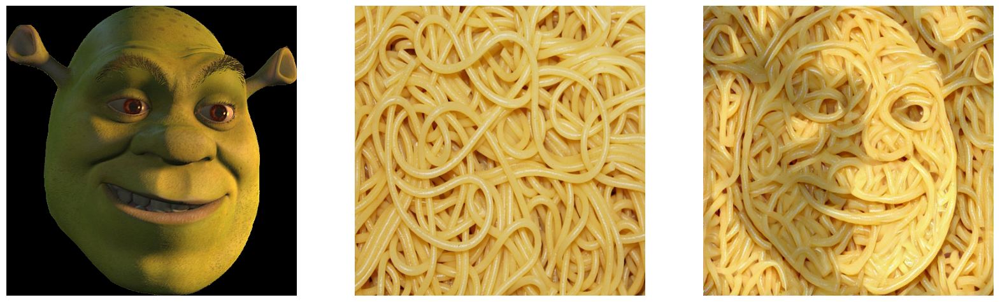

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))

ax1.imshow(np_convert(content))
ax1.axis('off')

ax2.imshow(np_convert(style))
ax2.axis('off')

ax3.imshow(np_convert(target))
ax3.axis('off')